# SIN2025 Summer School DdS

This notebook implemenic material flow analysis using the ODYM framework for the SIN2025 project. It includes system setup, data loading, parameter specification, and result analysis.


## System and Model Structure

This section describes the processes, system boundaries, and modeling structure used in thic material flow anasisi .


We consider the following model aspects for this model:
- time (t): 2023, 2030, 2040
- Element (e): HDPE, LDPE  (polymer groups)
- Unity: 1
- Product (p): industrial plastic packaging type, foil and trays

## Load Required Packages

In [1]:
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import logging as log
import openpyxl
from copy import deepcopy

## Set Path, Import ODYM Modules, Logging Routine

In [2]:
import odym.classes as msc
import odym.functions as msf
import odym.dynamic_stock_model as dsm

DataPath = ""

# Initialize loggin routine
log_verbosity = eval("log.DEBUG")
log_filename  = 'LogFileTest.md'
[Mylog, console_log, file_log] = msf.function_logger(log_filename, os.getcwd(), log_verbosity, log_verbosity)

## Load Configure Excel Sheet and Read Model Control Parameters

In [3]:
ProjectSpecs_ConFile = 'ODYM_Config_SING2025.xlsx'
Model_Configfile     = openpyxl.load_workbook(os.path.join(DataPath, ProjectSpecs_ConFile), data_only=True)

ScriptConfig         = {'Model Setting': Model_Configfile['Config'].cell(4,4).value} # Dictionary with config parameters
Model_Configsheet    = Model_Configfile['Setting_' + ScriptConfig['Model Setting']]

Name_Scenario        = Model_Configsheet.cell(4,4).value
print(Name_Scenario)

#Read control and selection parameters into dictionary
ScriptConfig         = msf.ParseModelControl(Model_Configsheet,ScriptConfig)

Mylog.info('Read and parse config table, including the model index table, from model config sheet.')

IT_Aspects,IT_Description,IT_Dimension,IT_Classification,IT_Selector,IT_IndexLetter,\
    PL_Names,PL_Description,PL_Version,PL_IndexStructure,PL_IndexMatch,PL_IndexLayer,PL_SubFolder,PL_ProxyCode, \
    PL_ProcMethod,PL_UpdateOverwrite,PrL_Number,PrL_Name,PrL_Comment,PrL_Type,\
        ScriptConfig = msf.ParseConfigFile(Model_Configsheet,ScriptConfig,Mylog)    

class_filename       = 'ODYM_Classifications_Master_SING2025.xlsx'
Classfile            = openpyxl.load_workbook(os.path.join(DataPath,class_filename), data_only=True)
Classsheet           = Classfile['MAIN_Table']
MasterClassification = msf.ParseClassificationFile_Main(Classsheet,Mylog)

INFO (1545936662.py <<module>>): Read and parse config table, including the model index table, from model config sheet.
INFO (parsing.py <ParseConfigFile>): Read parameter list from model config sheet.
INFO (parsing.py <ParseConfigFile>): Read process list from model config sheet.
INFO (parsing.py <ParseConfigFile>): Read model run control from model config sheet.
INFO (parsing.py <ParseConfigFile>): Read model output control from model config sheet.


ODYM_Config_SING2025


## Read Model Classification Excel Sheet and Data

In [4]:
Mylog.info('Define model classifications and select items for model classifications according to information provided by config file.')
ModelClassification  = {} # Dict of model classifications
for m in range(0,len(IT_Aspects)):
    ModelClassification[IT_Aspects[m]] = deepcopy(MasterClassification[IT_Classification[m]])
    EvalString = msf.EvalItemSelectString(IT_Selector[m],len(ModelClassification[IT_Aspects[m]].Items))
    if EvalString.find(':') > -1: # range of items is taken
        RangeStart = int(EvalString[0:EvalString.find(':')])
        RangeStop  = int(EvalString[EvalString.find(':')+1::])
        ModelClassification[IT_Aspects[m]].Items = ModelClassification[IT_Aspects[m]].Items[RangeStart:RangeStop]           
    elif EvalString.find('[') > -1: # selected items are taken
        ModelClassification[IT_Aspects[m]].Items = [ModelClassification[IT_Aspects[m]].Items[i] for i in eval(EvalString)]
    elif EvalString == 'all':
        None
    else:
        Mylog.error('Item select error for aspect ' + IT_Aspects[m] + ' were found in datafile.')
        break

# Define model index table and parameter dictionary
Mylog.info('### 2.2 - Define model index table and parameter dictionary')
Model_Time_Start = int(min(ModelClassification['Time'].Items))
Model_Time_End   = int(max(ModelClassification['Time'].Items))
Model_Duration   = Model_Time_End - Model_Time_Start + 1

Mylog.info('Define index table dataframe.')
IndexTable = pd.DataFrame({'Aspect'        : IT_Aspects,  # 'Time' and 'Element' must be present!
                           'Description'   : IT_Description,
                           'Dimension'     : IT_Dimension,
                           'Classification': [ModelClassification[Aspect] for Aspect in IT_Aspects],
                           'IndexLetter'   : IT_IndexLetter})  # Unique one letter (upper or lower case) indices to be used later for calculations.

# Default indexing of IndexTable, other indices are produced on the fly
IndexTable.set_index('Aspect', inplace=True)

# Add indexSize to IndexTable:
IndexTable['IndexSize'] = pd.Series([len(IndexTable.Classification[i].Items) for i in range(0, len(IndexTable.IndexLetter))],
                                    index=IndexTable.index)

# list of the classifications used for each indexletter
IndexTable_ClassificationNames = [IndexTable.Classification[i].Name for i in range(0, len(IndexTable.IndexLetter))]

INFO (3620152477.py <<module>>): Define model classifications and select items for model classifications according to information provided by config file.
INFO (3620152477.py <<module>>): ### 2.2 - Define model index table and parameter dictionary
INFO (3620152477.py <<module>>): Define index table dataframe.
/tmp/ipykernel_1361692/3620152477.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  IndexTable['IndexSize'] = pd.Series([len(IndexTable.Classification[i].Items) for i in range(0, len(IndexTable.IndexLetter))],
/tmp/ipykernel_1361692/3620152477.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  IndexTable_Cl

## Read Parameters From Individual Excel Sheets

In [5]:
ParameterDict = {}
mo_start = 0 # set mo for re-reading a certain parameter
for mo in range(mo_start,len(PL_Names)):
    ParPath = os.path.join(DataPath, PL_Names[mo] )
    Mylog.info('Reading parameter ' + PL_Names[mo])
    ThisParProcMethod='[]'

    # Do not change order of parameters handed over to function!
    MetaData, Values, Uncertainty = msf.ReadParameterXLSX(ParPath, PL_Names[mo], PL_IndexStructure[mo], PL_IndexMatch[mo],
                                         PL_IndexLayer[mo],ThisParProcMethod, MasterClassification, IndexTable,
                                         IndexTable_ClassificationNames, ScriptConfig, Mylog, ParseUncertainty = True)

    ParameterDict[PL_Names[mo]] = msc.Parameter(Name=MetaData['Dataset_Name'], ID=MetaData['Dataset_ID'],
                                                UUID=MetaData['Dataset_UUID'], P_Res=None, MetaData=MetaData,
                                                Indices=PL_IndexStructure[mo], Values=Values, Uncert=Uncertainty,
                                                Unit=MetaData['Dataset_Unit'])

    Mylog.info('Current parameter file UUID: ')
    Mylog.info('_')
Mylog.info('Reading of parameters finished.')

INFO (978488065.py <<module>>): Reading parameter FI.1
INFO (parameters.py <ReadParameterXLSX>): LIST
/tmp/ipykernel_1361692/978488065.py:9: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  MetaData, Values, Uncertainty = msf.ReadParameterXLSX(ParPath, PL_Names[mo], PL_IndexStructure[mo], PL_IndexMatch[mo],
INFO (parameters.py <ReadParameterXLSX>): A total of 6 values was read from file for parameter FI.1.
INFO (parameters.py <ReadParameterXLSX>): 6.0 of 24 values for parameter FI.1 were assigned.
INFO (978488065.py <<module>>): Current parameter file UUID: 
INFO (978488065.py <<module>>): _
INFO (978488065.py <<module>>): Reading parameter F2_1
INFO (parameters.py <ReadParameterXLSX>): LIST
INFO (parameters.py <ReadParameterXLSX>): A total of 6 values was read from file for parameter F2_1.
INFO (parameters.py <ReadParameterXLSX>): 6.0 of 24 values for parameter F2_1 were assigned.
INFO (978488065.py <<module

## Define MFA System
With the index table and parameter dictionary defined, we can now define the MFA system.

In [6]:
IndexTable

,Description,Dimension,Classification,IndexLetter,IndexSize
Aspect,,,,,
Scenario,Scenario,Scenario,<odym.classes.classification.Classification ob...,s,2
Time,Model time,Time,<odym.classes.classification.Classification ob...,t,3
Element,Polymer type,Element,<odym.classes.classification.Classification ob...,e,2
Unity,"trivial classification, 1 entry only",Unity,<odym.classes.classification.Classification ob...,1,1
Product,Plastic Packaging Product,Good,<odym.classes.classification.Classification ob...,p,2


In [7]:
#Define shortcuts for the most important index sizes:
Nt = len(IndexTable.Classification[IndexTable.index.get_loc('Time')].Items)
Ne = len(IndexTable.Classification[IndexTable.index.get_loc('Element')].Items)
Np = len(IndexTable.Classification[IndexTable.index.get_loc('Product')].Items)

/tmp/ipykernel_1361692/2793954790.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Nt = len(IndexTable.Classification[IndexTable.index.get_loc('Time')].Items)
/tmp/ipykernel_1361692/2793954790.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Ne = len(IndexTable.Classification[IndexTable.index.get_loc('Element')].Items)
/tmp/ipykernel_1361692/2793954790.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Np = len(IndexTable.Cla

In [8]:
ScriptConfig

{'Model Setting': 'Tutorial',
 'Name of model setting': 'ODYM_Config_SING2025',
 'Description': 'ODYM_Config_SING2025',
 'Name of model script used': 'ODYM_Config_SING2025',
 'Version of master classification': 'ODYM_Classifications_Master_SING2025',
 'Version of ODYM Classes': 'V02',
 'Version of ODYM Functions': 'V02',
 'Logging_Verbosity': 'DEBUG'}

In [9]:
PrL_Name

['Environment',
 'Use Phase',
 'Reusable Packaging ',
 'Incineration',
 'Recycling']

## Inserting data into the MFA system

In [10]:
MFA_System = msc.MFAsystem(Name = 'MFA_System', 
                      Geogr_Scope = 'Beglium', 
                      Unit = 't', 
                      ProcessList = [], 
                      FlowDict = {}, 
                      StockDict = {},
                      ParameterDict = ParameterDict, 
                      Time_Start = Model_Time_Start, 
                      Time_End = Model_Time_End, 
                      IndexTable = IndexTable, 
                      Elements = IndexTable.loc['Element'].Classification.Items) # Initialize MFA system

# Add processes to system
for m in range(0, len(PrL_Number)):
    MFA_System.ProcessList.append(msc.Process(Name = PrL_Name[m], ID   = PrL_Number[m]))

In [11]:
MFA_System.FlowDict['F1_4'].Values.shape

KeyError: 'F1_4'

In [12]:
# Define the flows of the system, and initialise their values:

MFA_System.FlowDict['FI.1'] = msc.Flow(Name = 'POM SUP', P_Start = 0, P_End = 1, Indices = 't,p,e', Values=None)
MFA_System.FlowDict['FI.2'] = msc.Flow(Name = 'POM RUP', P_Start = 0, P_End = 2, Indices = 't,p,e', Values=None)
MFA_System.FlowDict['F1_2'] = msc.Flow(Name = 'Colllected for reuse', P_Start = 1, P_End = 2, Indices = 't,p,e', Values=None)
MFA_System.FlowDict['F2_1'] = msc.Flow(Name = 'Put in Use Phase', P_Start = 2, P_End = 1, Indices = 't,p,e', Values=None)
MFA_System.FlowDict['F1_3'] = msc.Flow(Name = 'Incineration', P_Start = 1, P_End = 3, Indices = 't,p,e', Values=None)
MFA_System.FlowDict['F1_4'] = msc.Flow(Name = 'Recycling', P_Start = 1, P_End = 4, Indices = 't,p,e', Values=None)

# Define the stocks and stock changes of the system, and initialise their values:

MFA_System.StockDict['S_2']   = msc.Stock(Name = 'RUP stock', P_Res = 2, Type = 0,
                                              Indices = 't,p,e', Values=None)
MFA_System.StockDict['dS_2']  = msc.Stock(Name = 'RUP stock change', P_Res = 2, Type = 1,
                                              Indices = 't,p,e', Values=None)

MFA_System.StockDict['S_4']   = msc.Stock(Name = 'Incineratio stock', P_Res = 3, Type = 0,
                                              Indices = 't,p,e', Values=None)
MFA_System.StockDict['dS_4']  = msc.Stock(Name = 'Incineration stock change', P_Res = 3, Type = 1,
                                              Indices = 't,p,e', Values=None)

MFA_System.StockDict['S_5']   = msc.Stock(Name = 'Recycling stock', P_Res = 4, Type = 0,
                                              Indices = 't,p,e', Values=None)
MFA_System.StockDict['dS_5']  = msc.Stock(Name = 'Recycling stock change', P_Res = 4, Type = 1, Indices = 't,p,e', Values=None)

# Assign empty arrays to flows according to dimensions.
MFA_System.Initialize_FlowValues() 
MFA_System.Initialize_StockValues() 

In [13]:
# Check whether flow value arrays match their indices, etc. See method documentation.
MFA_System.Consistency_Check() 

ValueError: Dimension mismatch. Dimension of classifiation needs to fit to dimension of flow or parameter index. Found a mismatch for the following index: Scenario. Check your index table definition!

## Programming a solution of the MFA system
When the system definition is complete, the model solution can be programmed. 

In [14]:
MFA_System.FlowDict['FI.1'].Values = MFA_System.ParameterDict['FI.1'].Values
MFA_System.FlowDict['F2_1'].Values = MFA_System.ParameterDict['F2_1'].Values

In [15]:
MFA_System.FlowDict['F1_2'].Values =  MFA_System.ParameterDict['P2_1_1_2'].Values*MFA_System.FlowDict['F2_1'].Values

MFA_System.FlowDict['F1_3'].Values = MFA_System.ParameterDict['P2_1_1_3'].Values*MFA_System.FlowDict['F2_1'].Values + \
    MFA_System.ParameterDict['PI.1_1_3'].Values*MFA_System.FlowDict['FI.1'].Values

MFA_System.FlowDict['F1_4'].Values = MFA_System.ParameterDict['P2_1_1_4'].Values*MFA_System.FlowDict['F2_1'].Values+  \
    MFA_System.ParameterDict['PI.1_1_4'].Values*MFA_System.FlowDict['FI.1'].Values

In [16]:
MFA_System.FlowDict['FI.2'].Values = MFA_System.FlowDict['F2_1'].Values - MFA_System.FlowDict['F1_2'].Values

In [17]:
ModelClassification['Time'].Items

[2023, 2030, 2040]

DEBUG (pyplot.py <switch_backend>): Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG (pyplot.py <switch_backend>): Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG (font_manager.py <_findfont_cached>): findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG (font_manager.py <_findfont_cached>): findfont: score(FontEntry(fname='/opt/tljh/user/envs/bw25/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/cmb10.ttf', name='cmb10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG (font_manager.py <_findfont_cached>): findfont: score(FontEntry(fname='/opt/tljh/user/envs/bw25/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/cmex10.ttf', name='cmex10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG (font_manager.py <_findfont_cached>): findfont: score(FontEntry(fname='/opt

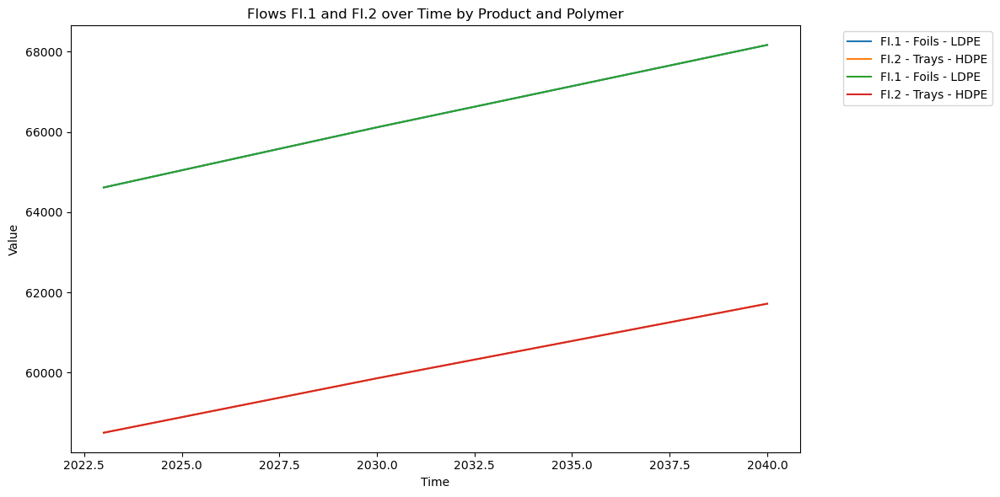

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

records = []

# Extract the labels
scenario_labels = ModelClassification['Scenario'].Items
time_labels = ModelClassification['Time'].Items
product_labels = ModelClassification['Product'].Items
polymer_labels = ModelClassification['Element'].Items

# Extract data
for flow_key, flow_obj in MFA_System.FlowDict.items():
    if flow_obj.Values is not None:
        for scenario_idx, scenario_label in enumerate(scenario_labels):
            for time_idx, time_label in enumerate(time_labels):
                for prod_idx, prod_label in enumerate(product_labels):
                    for poly_idx, poly_label in enumerate(polymer_labels):
                        value = flow_obj.Values[scenario_idx, time_idx, prod_idx, poly_idx]
                        records.append({
                            "Scenario": scenario_label,
                            "Time": time_label,
                            "Flow": flow_key,
                            "Product": prod_label,
                            "Polymer": poly_label,
                            "Value": value
                        })

# Create DataFrame
df = pd.DataFrame(records)

# Filter to include both FI.1 and FI.2
df_plot = df[df["Flow"].isin(["FI.1", "FI.2"]) & (df["Value"] != 0)]

# Sort for consistent plotting
df_plot = df_plot.sort_values(by=["Flow", "Product", "Polymer", "Time"])

# Plot
plt.figure(figsize=(12, 6))
for (scenario, flow, product, polymer), group in df_plot.groupby(["Scenario", "Flow", "Product", "Polymer"]):
    plt.plot(group["Time"], group["Value"], label=f"{flow} - {product} - {polymer}")

plt.title("Flows FI.1 and FI.2 over Time by Product and Polymer")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



/tmp/ipykernel_1361692/381735930.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab10", len(scenarios))
DEBUG (font_manager.py <_findfont_cached>): findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.33.
DEBUG (font_manager.py <_findfont_cached>): findfont: score(FontEntry(fname='/opt/tljh/user/envs/bw25/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/cmb10.ttf', name='cmb10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG (font_manager.py <_findfont_cached>): findfont: score(FontEntry(fname='/opt/tljh/user/envs/bw25/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/cmex10.ttf', name='cmex10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable'))

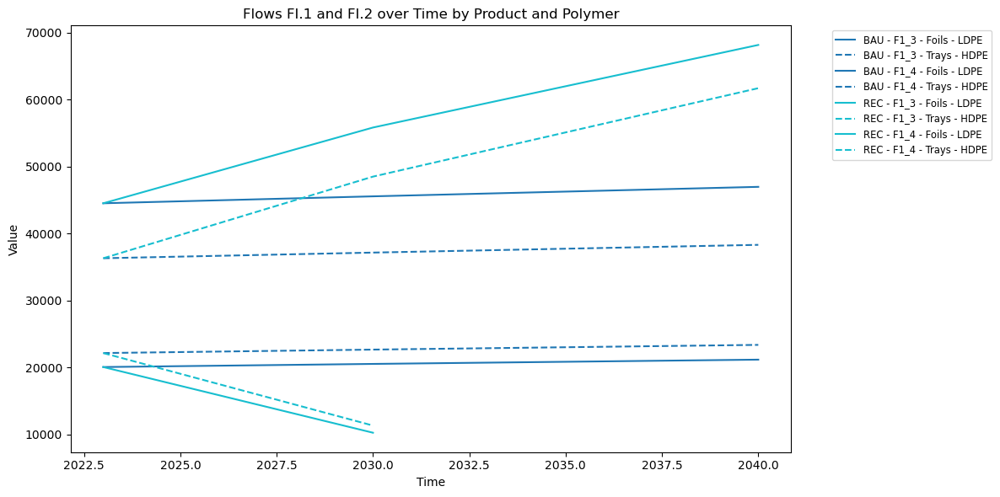

In [19]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Filter to include both FI.1 and FI.2
df_plot = df[df["Flow"].isin(["F1_4", "F1_3"]) & (df["Value"] != 0)]

# Sort for consistent plotting
df_plot = df_plot.sort_values(by=["Flow", "Product", "Polymer", "Time"])

# Assign unique color to each scenario
scenarios = df_plot["Scenario"].unique()
colors = cm.get_cmap("tab10", len(scenarios))
scenario_color_map = {scenario: colors(i) for i, scenario in enumerate(scenarios)}

# Assign line styles to polymers
line_styles = ['-', '--', '-.', ':']
polymers = df_plot["Polymer"].unique()
polymer_style_map = {polymer: line_styles[i % len(line_styles)] for i, polymer in enumerate(polymers)}

# Plot
plt.figure(figsize=(12, 6))
for (scenario, flow, product, polymer), group in df_plot.groupby(["Scenario", "Flow", "Product", "Polymer"]):
    color = scenario_color_map[scenario]
    linestyle = polymer_style_map[polymer]
    plt.plot(group["Time"], group["Value"],
             label=f"{scenario} - {flow} - {product} - {polymer}",
             color=color, linestyle=linestyle)

plt.title("Flows FI.1 and FI.2 over Time by Product and Polymer")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()
plt.show()


In [20]:
MFA_System.FlowDict['FI.1'].Values.shape

(2, 3, 2, 2)

In [21]:
# Filter for F1_3 and F1_4
df_rate = df[df["Flow"].isin(["F1_3", "F1_4"])]

# Group and pivot to get F1_3 and F1_4 side by side
df_pivot = df_rate.pivot_table(
    index=["Scenario", "Product", "Polymer", "Time"],
    columns="Flow",
    values="Value",
    aggfunc="sum",  # or "first" if values are guaranteed unique
    fill_value=0
).reset_index()

# Calculate recycling rate
df_pivot["RecyclingRate"] = df_pivot["F1_4"] / (df_pivot["F1_3"] + df_pivot["F1_4"])

# Optional: drop rows where denominator is 0 to avoid NaN/inf
df_pivot = df_pivot[(df_pivot["F1_3"] + df_pivot["F1_4"]) > 0]


In [22]:
df_pivot

Flow,Scenario,Product,Polymer,Time,F1_3,F1_4,RecyclingRate
3,BAU,Foils,LDPE,2023,20082.121243,44533.808757,0.689208
4,BAU,Foils,LDPE,2030,20548.505208,45568.054792,0.689208
5,BAU,Foils,LDPE,2040,21187.064893,46984.115107,0.689208
6,BAU,Trays,HDPE,2023,22170.634800,36327.077900,0.621000
7,BAU,Trays,HDPE,2030,22685.522447,37170.732753,0.621000
8,BAU,Trays,HDPE,2040,23390.491987,38325.841013,0.621000
15,REC,Foils,LDPE,2023,20082.121243,44533.808757,0.689208
16,REC,Foils,LDPE,2030,10274.252604,55842.307396,0.844604
17,REC,Foils,LDPE,2040,0.000000,68171.180000,1.000000
18,REC,Trays,HDPE,2023,22170.634800,36327.077900,0.621000


/tmp/ipykernel_1361692/2019311424.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("tab10", len(scenarios))


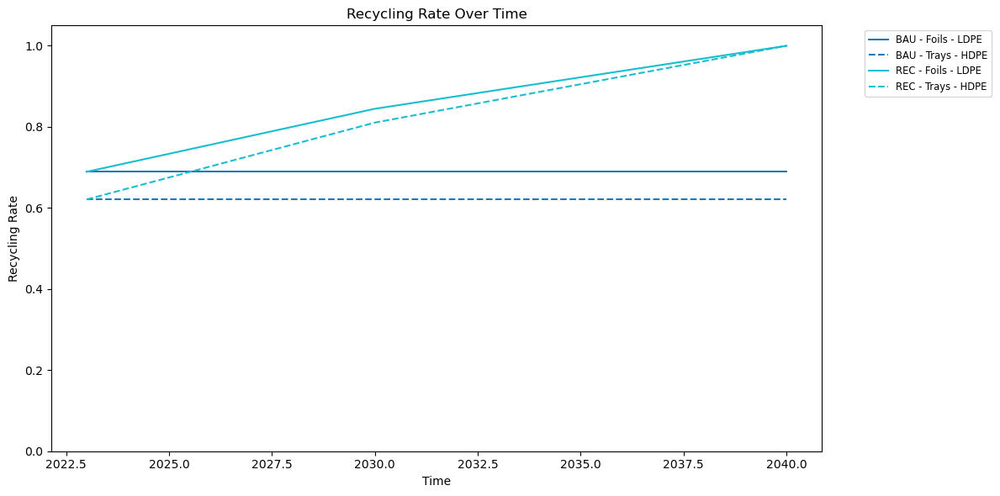

In [23]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assign colors to scenarios
scenarios = df_pivot["Scenario"].unique()
colors = cm.get_cmap("tab10", len(scenarios))
scenario_color_map = {scenario: colors(i) for i, scenario in enumerate(scenarios)}

# Assign line styles to polymers
line_styles = ['-', '--', '-.', ':']
polymers = df_pivot["Polymer"].unique()
polymer_style_map = {polymer: line_styles[i % len(line_styles)] for i, polymer in enumerate(polymers)}

# Plot
plt.figure(figsize=(12, 6))
for (scenario, product, polymer), group in df_pivot.groupby(["Scenario", "Product", "Polymer"]):
    color = scenario_color_map[scenario]
    linestyle = polymer_style_map[polymer]
    plt.plot(group["Time"], group["RecyclingRate"],
             label=f"{scenario} - {product} - {polymer}",
             color=color, linestyle=linestyle)

plt.title("Recycling Rate Over Time")
plt.xlabel("Time")
plt.ylabel("Recycling Rate")
plt.ylim(0, 1.05)  # ensure y-axis is within bounds
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()
plt.show()


In [57]:
# Filter for F1_3 and F1_4
df_rate = df[df["Flow"].isin(["FI.1", "FI.2", "F1_3", "F1_4"])]

# Group and pivot to get F1_3 and F1_4 side by side
df_pivot = df_rate.pivot_table(
    index=["Scenario", "Product", "Polymer", "Time"],
    columns="Flow",
    values="Value",
    aggfunc="sum",  # or "first" if values are guaranteed unique
    fill_value=0
).reset_index()

df_rate #= df_rate[df_rate['Value']>0]

,Scenario,Time,Flow,Product,Polymer,Value
0,BAU,2023,FI.1,Foils,HDPE,0.000
1,BAU,2023,FI.1,Foils,LDPE,64615.930
2,BAU,2023,FI.1,Trays,HDPE,0.000
3,BAU,2023,FI.1,Trays,LDPE,0.000
4,BAU,2030,FI.1,Foils,HDPE,0.000
...,...,...,...,...,...,...
139,REC,2030,F1_4,Trays,LDPE,0.000
140,REC,2040,F1_4,Foils,HDPE,0.000
141,REC,2040,F1_4,Foils,LDPE,68171.180
142,REC,2040,F1_4,Trays,HDPE,61716.333


In [58]:
df_rate["GWP"]=0

/tmp/ipykernel_1361692/620997298.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rate["GWP"]=0


In [66]:
df_rate = df_rate[df_rate["Flow"].isin(["F1_3"])]
df_rate

,Scenario,Time,Flow,Product,Polymer,Value,GWP
96,BAU,2023,F1_3,Foils,HDPE,0.000000,0.000000e+00
97,BAU,2023,F1_3,Foils,LDPE,20082.121243,2.056498e+05
98,BAU,2023,F1_3,Trays,HDPE,22170.634800,2.653676e-02
99,BAU,2023,F1_3,Trays,LDPE,0.000000,0.000000e+00
100,BAU,2030,F1_3,Foils,HDPE,0.000000,0.000000e+00
101,BAU,2030,F1_3,Foils,LDPE,20548.505208,1.130092e+00
102,BAU,2030,F1_3,Trays,HDPE,22685.522447,3.380211e+06
103,BAU,2030,F1_3,Trays,LDPE,0.000000,0.000000e+00
104,BAU,2040,F1_3,Foils,HDPE,0.000000,0.000000e+00
105,BAU,2040,F1_3,Foils,LDPE,21187.064893,5.045143e+04


In [48]:
import bw2data as bd
import bw2io as bi

PROJECT_NAME = "plastic"

bi.restore_project_directory(
    fp='/etc/data/ecoinvent-3.10-cutoff-bw25.tar.gz',
    project_name=PROJECT_NAME,
    overwrite_existing=True,
)
bd.projects.set_current(PROJECT_NAME)

DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "projectdataset" ("id" INTEGER NOT NULL PRIMARY KEY, "is_sourced" INTEGER NOT NULL DEFAULT 0, "revision" INTEGER, "data" BLOB NOT NULL, "name" TEXT NOT NULL, "full_hash" INTEGER NOT NULL DEFAULT 1)', [])
DEBUG (peewee.py <execute_sql>): ('CREATE UNIQUE INDEX IF NOT EXISTS "projectdataset_name" ON "projectdataset" ("name")', [])
DEBUG (peewee.py <execute_sql>): ('PRAGMA "main".table_info("projectdataset")', None)
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['default', 1, 0])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['default', 1, 0])
DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "activitydat

Restoring project backup archive - this could take a few minutes...


DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['plastic', 1, 0])
DEBUG (peewee.py <execute_sql>): ('INSERT INTO "projectdataset" ("is_sourced", "data", "name", "full_hash") VALUES (?, ?, ?, ?)', [False, <memory at 0x7fb19c850400>, 'plastic', False])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['plastic', 1, 0])
DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "activitydataset" ("id" INTEGER NOT NULL PRIMARY KEY, "data" BLOB NOT NULL, "code" TEXT NOT NULL, "database" TEXT NOT NULL, "location" TEXT, "name" TEXT, "product" TEXT, "type" TEXT)', [])
DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "exchangedataset" ("id" INTEGER NOT NULL PRIMARY KEY, 

Restored project: plastic


DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['plastic', 1, 0])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."is_sourced", "t1"."revision", "t1"."data", "t1"."name", "t1"."full_hash" FROM "projectdataset" AS "t1" WHERE ("t1"."name" = ?) LIMIT ? OFFSET ?', ['plastic', 1, 0])
DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "activitydataset" ("id" INTEGER NOT NULL PRIMARY KEY, "data" BLOB NOT NULL, "code" TEXT NOT NULL, "database" TEXT NOT NULL, "location" TEXT, "name" TEXT, "product" TEXT, "type" TEXT)', [])
DEBUG (peewee.py <execute_sql>): ('CREATE TABLE IF NOT EXISTS "exchangedataset" ("id" INTEGER NOT NULL PRIMARY KEY, "data" BLOB NOT NULL, "input_code" TEXT NOT NULL, "input_database" TEXT NOT NULL, "output_code" TEXT NOT NULL, "output_database" TEXT NOT NULL, "type" TEXT NOT NULL)', [])
DEBUG (peewee

03:44:47+0000 [info     ] Applying automatic update: 4.0 database search directories FTS5
03:44:47+0000 [info     ] Reindexing database ecoinvent-3.10-biosphere


DEBUG (peewee.py <execute_sql>): ('DROP TABLE IF EXISTS "bw2schema"', [])
DEBUG (peewee.py <execute_sql>): ('CREATE VIRTUAL TABLE IF NOT EXISTS "bw2schema" USING fts5 ("name", "comment", "product", "categories", "synonyms", "location", "database", "code", tokenize="unicode61")', [])
DEBUG (peewee.py <execute_sql>): ('DROP TABLE IF EXISTS "bw2schema"', [])
DEBUG (peewee.py <execute_sql>): ('CREATE VIRTUAL TABLE IF NOT EXISTS "bw2schema" USING fts5 ("name", "comment", "product", "categories", "synonyms", "location", "database", "code", tokenize="unicode61")', [])
DEBUG (peewee.py <execute_sql>): ('SELECT name FROM "main".sqlite_master WHERE type=? ORDER BY name', ('table',))
DEBUG (peewee.py <execute_sql>): ('SELECT COUNT(1) FROM (SELECT 1 FROM "activitydataset" AS "t1" WHERE ("t1"."database" = ?)) AS "_wrapped"', ['ecoinvent-3.10-biosphere'])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."data", "t1"."code", "t1"."database", "t1"."location", "t1"."name", "t1"."product", "t1"

03:44:47+0000 [info     ] Reindexing database ecoinvent-3.10-cutoff


DEBUG (peewee.py <execute_sql>): ('DROP TABLE IF EXISTS "bw2schema"', [])
DEBUG (peewee.py <execute_sql>): ('CREATE VIRTUAL TABLE IF NOT EXISTS "bw2schema" USING fts5 ("name", "comment", "product", "categories", "synonyms", "location", "database", "code", tokenize="unicode61")', [])
DEBUG (peewee.py <execute_sql>): ('DROP TABLE IF EXISTS "bw2schema"', [])
DEBUG (peewee.py <execute_sql>): ('CREATE VIRTUAL TABLE IF NOT EXISTS "bw2schema" USING fts5 ("name", "comment", "product", "categories", "synonyms", "location", "database", "code", tokenize="unicode61")', [])
DEBUG (peewee.py <execute_sql>): ('SELECT name FROM "main".sqlite_master WHERE type=? ORDER BY name', ('table',))
DEBUG (peewee.py <execute_sql>): ('SELECT COUNT(1) FROM (SELECT 1 FROM "activitydataset" AS "t1" WHERE ("t1"."database" = ?)) AS "_wrapped"', ['ecoinvent-3.10-cutoff'])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."data", "t1"."code", "t1"."database", "t1"."location", "t1"."name", "t1"."product", "t1"."t

Get relevant ecoinvent processes.

In [61]:
mswi = bd.get_node(name="treatment of municipal solid waste, municipal incineration", location="BE", unit="kilogram")

DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."data", "t1"."code", "t1"."database", "t1"."location", "t1"."name", "t1"."product", "t1"."type" FROM "activitydataset" AS "t1" WHERE (("t1"."name" = ?) AND ("t1"."location" = ?))', ['treatment of municipal solid waste, municipal incineration', 'BE'])
/opt/tljh/user/envs/bw25/lib/python3.12/site-packages/bw2data/utils.py:375: UserWarning: Given search criteria very broad; try to specify at least a database
  warnings.warn("Given search criteria very broad; try to specify at least a database")


In [62]:
truck = bd.get_node(name="transport, freight, light commercial vehicle", unit="ton kilometer", location="Europe without Switzerland")

DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."data", "t1"."code", "t1"."database", "t1"."location", "t1"."name", "t1"."product", "t1"."type" FROM "activitydataset" AS "t1" WHERE (("t1"."name" = ?) AND ("t1"."location" = ?))', ['transport, freight, light commercial vehicle', 'Europe without Switzerland'])


Build our model. We have the following processes:

* Use of plastic in Belgium waffle land

And the following products:

* service_of_plastic_packaging (functional unit)

In [70]:
method=[
    method for method in bd.methods
    if 'ipcc 2013 no lt' in method[0].lower()
    and 'global temperature change potential (GTP100) no LT' in method[2]
][0]

In [71]:
for index, row in df_rate.iterrows():
    tons =row['Value']

    plastic_db = bd.Database("Plastic use in Belgium")
    plastic_db.register()

    plastic_use = plastic_db.new_node(
        name="Use of plastic",
        location="BE",
        type=bd.labels.process_node_default
    )
    plastic_use.save()
    
    service_of_plastic_packaging = plastic_db.new_node(
        name="Enjoyment we get from using plastic, yeah!",
        unit="kg",
        type=bd.labels.product_node_default
    )
    service_of_plastic_packaging.save()
    
    plastic_use.new_edge(
        input=service_of_plastic_packaging,
        amount=1,
        type=bd.labels.production_edge_default,
        functional=True,
    ).save()
    
    plastic_use.new_edge(
        input=truck,
        amount= tons*70,
        type=bd.labels.consumption_edge_default
    ).save()
    
    plastic_use.new_edge(
        input=mswi,
        amount=tons,
        type=bd.labels.production_edge_default,
        functional=False
    ).save()
    import bw2calc as bc

    fu, data_objs, _ = bd.prepare_lca_inputs({service_of_plastic_packaging: 1}, method=method)

    lca = bc.LCA(fu, data_objs=data_objs)
    lca.lci()
    lca.lcia()
    lca.score
    
    df_rate.at[index, 'GWP'] = lca.score

df_rate

DEBUG (local.py <__init__>): open file: /home/jupyter-sing_sofieferauge/.local/share/Brightway3/plastic.3f01a108/processed/Plastic-use-in-Belgium.519433cf.zip
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."id", "t1"."location" FROM "activitydataset" AS "t1" WHERE (("t1"."database" = ?) AND ("t1"."type" IN (?, ?, ?)))', ['Plastic use in Belgium', 'process', 'processwithreferenceproduct', 'readonly_process'])
DEBUG (peewee.py <execute_sql>): ('SELECT COUNT(1) FROM (SELECT 1 FROM "activitydataset" AS "t1" WHERE (("t1"."database" = ?) AND ("t1"."type" IN (?, ?, ?)))) AS "_wrapped"', ['Plastic use in Belgium', 'process', 'processwithreferenceproduct', 'readonly_process'])
DEBUG (peewee.py <execute_sql>): ('SELECT "t1"."data", "t2"."id", "t3"."id", "t1"."input_database", "t1"."input_code", "t1"."output_database", "t1"."output_code" FROM "exchangedataset" AS "t1" LEFT OUTER JOIN "activitydataset" AS "t2" ON (("t2"."code" = "t1"."input_code") AND ("t2"."database" = "t1"."input_database")) LEF

,Scenario,Time,Flow,Product,Polymer,Value,GWP
96,BAU,2023,F1_3,Foils,HDPE,0.000000,0.000000e+00
97,BAU,2023,F1_3,Foils,LDPE,20082.121243,2.682831e+06
98,BAU,2023,F1_3,Trays,HDPE,22170.634800,2.961842e+06
99,BAU,2023,F1_3,Trays,LDPE,0.000000,0.000000e+00
100,BAU,2030,F1_3,Foils,HDPE,0.000000,0.000000e+00
101,BAU,2030,F1_3,Foils,LDPE,20548.505208,2.745137e+06
102,BAU,2030,F1_3,Trays,HDPE,22685.522447,3.030627e+06
103,BAU,2030,F1_3,Trays,LDPE,0.000000,0.000000e+00
104,BAU,2040,F1_3,Foils,HDPE,0.000000,0.000000e+00
105,BAU,2040,F1_3,Foils,LDPE,21187.064893,2.830444e+06


In [72]:
df_rate

,Scenario,Time,Flow,Product,Polymer,Value,GWP
96,BAU,2023,F1_3,Foils,HDPE,0.000000,0.000000e+00
97,BAU,2023,F1_3,Foils,LDPE,20082.121243,2.682831e+06
98,BAU,2023,F1_3,Trays,HDPE,22170.634800,2.961842e+06
99,BAU,2023,F1_3,Trays,LDPE,0.000000,0.000000e+00
100,BAU,2030,F1_3,Foils,HDPE,0.000000,0.000000e+00
101,BAU,2030,F1_3,Foils,LDPE,20548.505208,2.745137e+06
102,BAU,2030,F1_3,Trays,HDPE,22685.522447,3.030627e+06
103,BAU,2030,F1_3,Trays,LDPE,0.000000,0.000000e+00
104,BAU,2040,F1_3,Foils,HDPE,0.000000,0.000000e+00
105,BAU,2040,F1_3,Foils,LDPE,21187.064893,2.830444e+06


In [13]:
plastic_db = bd.Database("Plastic use in Belgium")
plastic_db.register()

plastic_use = plastic_db.new_node(
    name="Use of plastic",
    location="BE",
    type=bd.labels.process_node_default
)
plastic_use.save()

service_of_plastic_packaging = plastic_db.new_node(
    name="Enjoyment we get from using plastic, yeah!",
    unit="kg",
    type=bd.labels.product_node_default
)
service_of_plastic_packaging.save()

plastic_use.new_edge(
    input=service_of_plastic_packaging,
    amount=1,
    type=bd.labels.production_edge_default,
    functional=True,
).save()

plastic_use.new_edge(
    input=truck,
    amount=70,
    type=bd.labels.consumption_edge_default
).save()

plastic_use.new_edge(
    input=mswi,
    amount=17,
    type=bd.labels.production_edge_default,
    functional=False
).save()

In [14]:
method = bd.methods.random()

In [15]:
import bw2calc as bc

fu, data_objs, _ = bd.prepare_lca_inputs({service_of_plastic_packaging: 1}, method=method)

lca = bc.LCA(fu, data_objs=data_objs)
lca.lci()
lca.lcia()
lca.score

5385.839291365609

/tmp/ipykernel_1361692/2134129286.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["Label"] = subset["Time"].astype(str) + " " + subset["Product"]


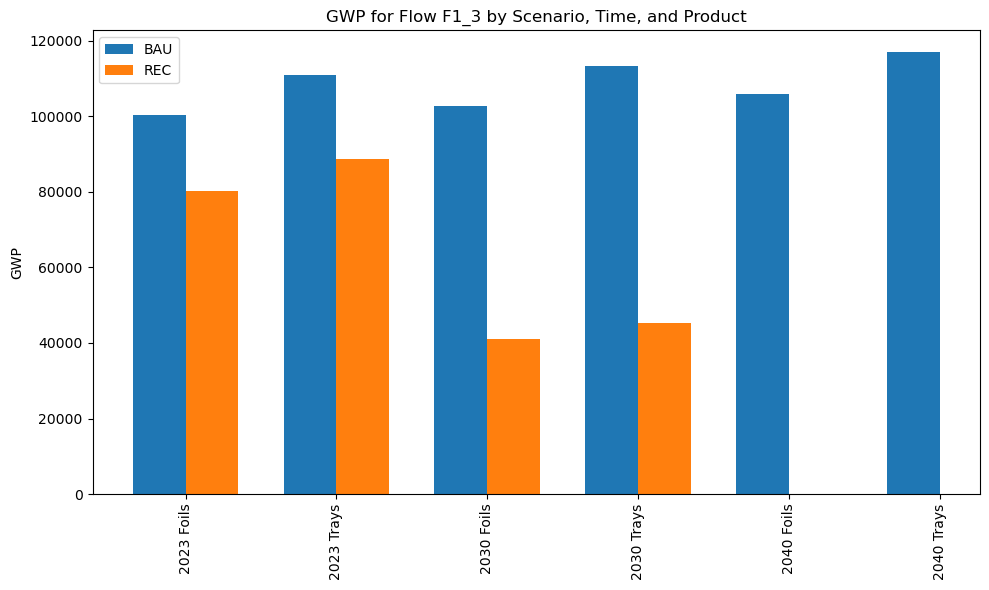

/tmp/ipykernel_1361692/2134129286.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset["Label"] = subset["Time"].astype(str) + " " + subset["Product"]


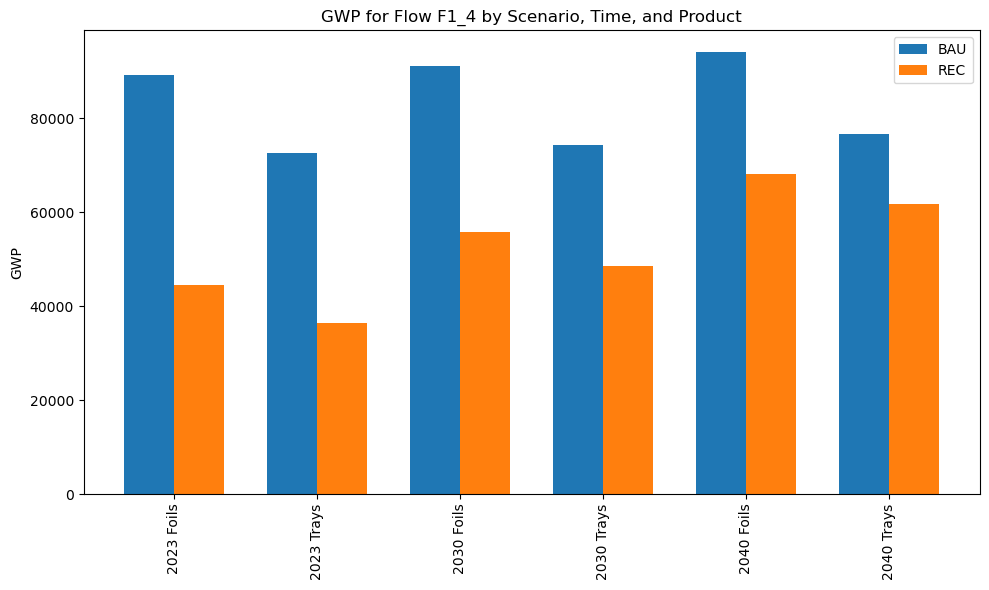

In [38]:
import numpy as np

# Create grouped bar plots for each flow type
flows = ["F1_3", "F1_4"]

for flow in flows:
    plt.figure(figsize=(10, 6))
    subset = df_rate_RECINC[df_rate_RECINC["Flow"] == flow]

    # Create unique labels for Time and Product
    subset["Label"] = subset["Time"].astype(str) + " " + subset["Product"]
    labels = subset["Label"].unique()
    
    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    # Extract data for BAU and REC
    bau_data = subset[subset["Scenario"] == "BAU"].set_index("Label").reindex(labels)["GWP"]
    rec_data = subset[subset["Scenario"] == "REC"].set_index("Label").reindex(labels)["GWP"]

    plt.bar(x - width/2, bau_data, width, label="BAU")
    plt.bar(x + width/2, rec_data, width, label="REC")

    plt.xticks(x, labels, rotation=90)
    plt.ylabel("GWP")
    plt.title(f"GWP for Flow {flow} by Scenario, Time, and Product")
    plt.legend()
    plt.tight_layout()
    plt.show()


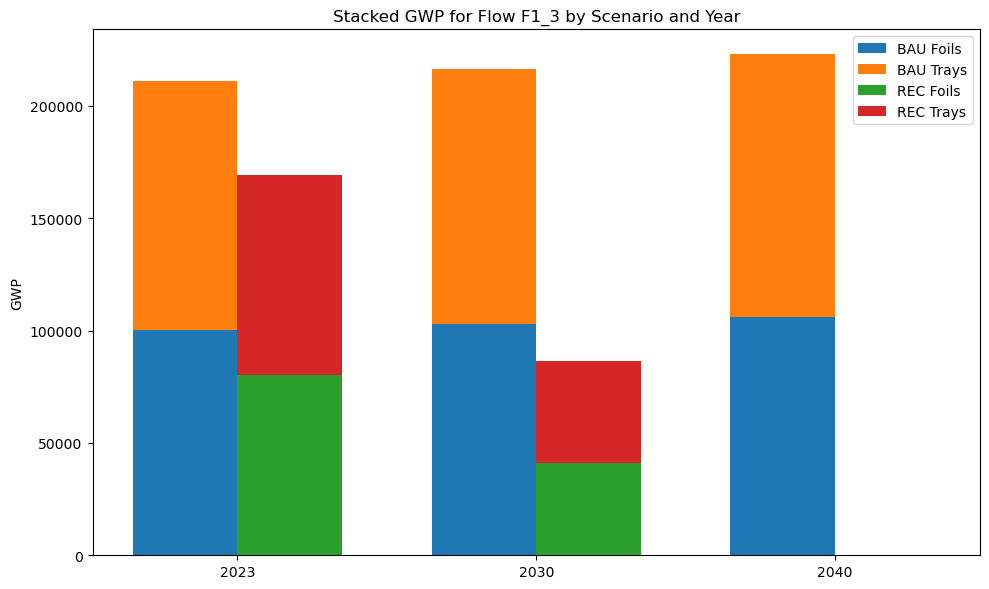

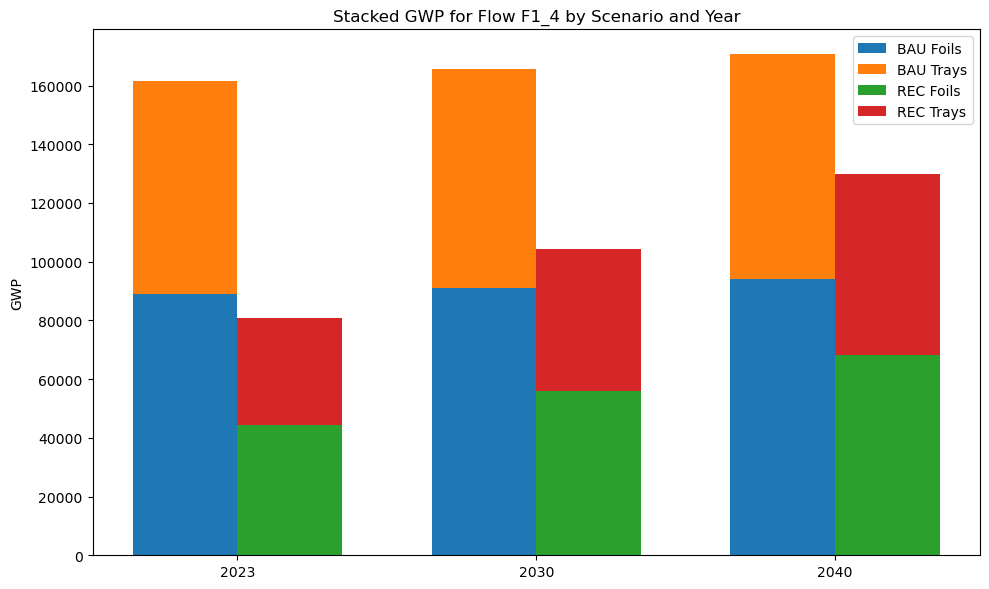

In [40]:
# Fix: Ensure foil_values and tray_values are aligned correctly with the x-axis (i.e., same shape as x)

for flow in flows:
    plt.figure(figsize=(10, 6))
    subset = df_rate_RECINC[df_rate_RECINC["Flow"] == flow].copy()

    # Group by Time, Scenario, and Product, summing GWP
    grouped = subset.groupby(["Time", "Scenario", "Product"])["GWP"].sum().unstack(fill_value=0)

    # Extract unique years and ensure consistent ordering
    years = sorted(grouped.index.get_level_values("Time").unique())
    scenarios = ["BAU", "REC"]
    width = 0.35
    x = np.arange(len(years))

    for i, scenario in enumerate(scenarios):
        scenario_data = grouped.loc[(slice(None), scenario), :]
        scenario_data = scenario_data.droplevel("Scenario").reindex(years, fill_value=0)

        foil_values = scenario_data.get("Foils", pd.Series(0, index=years)).values
        tray_values = scenario_data.get("Trays", pd.Series(0, index=years)).values

        pos = x + (i - 0.5) * width
        plt.bar(pos, foil_values, width, label=f"{scenario} Foils")
        plt.bar(pos, tray_values, width, bottom=foil_values, label=f"{scenario} Trays")

    plt.xticks(x, years)
    plt.ylabel("GWP")
    plt.title(f"Stacked GWP for Flow {flow} by Scenario and Year")
    plt.legend()
    plt.tight_layout()
    plt.show()
